In [192]:
import altair as alt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import requests
import io
from PIL import Image

In [61]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [142]:
df_wikidata = pd.read_csv("data/wikidata/wikidata_w_image-labels.csv")

In [146]:
df_wikidata[['tgm','themeLabel']]

,tgm,themeLabel
0,tgm002065,cigarette
1,tgm002065,cigarette
2,tgm002065,cigarette
3,tgm002065,cigarette
4,tgm002065,cigarette
...,...,...
12145,tgm000686,award
12146,tgm002207,coachman
12147,tgm003584,work
12148,tgm003584,work


In [148]:
mapping_wiki = pd.Series(df_wikidata.themeLabel.values,index=df_wikidata.tgm).to_dict()

In [149]:
df_loc = pd.read_csv("data/loc/loc-images-labels.csv", index_col=0)

In [177]:
df_loc

,id,desc,term,source,url,urlhash,dl_fpath
0,tgm012273,"Library [of Congress, main reading room, Washi...",Glass,https://www.loc.gov/pictures/item/2016819413/,https://tile.loc.gov/storage-services/service/...,7602538306817500955,/content/drive/MyDrive/IIIF_AI_project/loc-ima...
1,tgm012273,[Stained glass windows],Glass,https://www.loc.gov/pictures/item/2016819457/,https://tile.loc.gov/storage-services/service/...,5118696290488460889,/content/drive/MyDrive/IIIF_AI_project/loc-ima...
2,tgm012273,Cone-shaped exterior feature at the Museum of ...,Glass,https://www.loc.gov/pictures/item/2018699148/,https://tile.loc.gov/storage-services/service/...,6870037889152250380,/content/drive/MyDrive/IIIF_AI_project/loc-ima...
3,tgm012273,Cone-shaped exterior feature at the Museum of ...,Glass,https://www.loc.gov/pictures/item/2018699154/,https://tile.loc.gov/storage-services/service/...,7982561646346347480,/content/drive/MyDrive/IIIF_AI_project/loc-ima...
4,tgm012273,"[Library of Congress (Washington, D.C.). Leade...",Glass,https://www.loc.gov/pictures/item/2001695198/,https://tile.loc.gov/storage-services/service/...,7604142429060397848,/content/drive/MyDrive/IIIF_AI_project/loc-ima...
...,...,...,...,...,...,...,...
309,tgm005206,[Women in ball gowns and men in military unifo...,Hugging,https://www.loc.gov/pictures/item/2014636865/,https://tile.loc.gov/storage-services/service/...,14444571320524864236,/content/drive/MyDrive/IIIF_AI_project/loc-ima...
310,tgm005206,"[Man wearing military uniform, holding rifle, ...",Hugging,https://www.loc.gov/pictures/item/2014636866/,https://tile.loc.gov/storage-services/service/...,17792737987633900689,/content/drive/MyDrive/IIIF_AI_project/loc-ima...
311,tgm005206,[Hypnotist directing group of people to do unu...,Hugging,https://www.loc.gov/pictures/item/2014636869/,https://tile.loc.gov/storage-services/service/...,10009959822675100284,/content/drive/MyDrive/IIIF_AI_project/loc-ima...
312,tgm005206,Bronson Howard's greater Shenandoah,Hugging,https://www.loc.gov/pictures/item/2014637152/,https://tile.loc.gov/storage-services/service/...,10686015549828858807,/content/drive/MyDrive/IIIF_AI_project/loc-ima...


In [154]:
mapping_loc = pd.Series(df_loc.term.values,index=df_loc.id).to_dict()

In [156]:
mapping = {**mapping_loc , **mapping_wiki}

### Intersection between our two collections 

In [164]:
intersection = set(df.LOC.values).intersection(df.Wikidata.values)
intersection

{'tgm000099', 'tgm001333', 'tgm005206'}

Decoded intersection 

In [166]:
list(map(lambda x: mapping[x],intersection))

['bridge', 'advertising', 'hug']

In [168]:
df_loc['url'][0]

'https://tile.loc.gov/storage-services/service/pnp/npcc/00100/00126r.jpg'

In [170]:
df_wikidata['url'][0]

'http://commons.wikimedia.org/wiki/Special:FilePath/11-00%20A.M.%20Monday%2C%20May%209th%2C%201910.%20Newsies%20at%20Skeeter%27s%20Branch%2C%20Jefferson%20near%20Franklin.%20They%20were%20all%20smoking.%20Location-%20St.%20Louis%2C%20Missouri.%20MET%20DP352686.jpg'

In [176]:
filtered_wiki = df_wikidata[df_wikidata['tgm'].isin(intersection)]

In [179]:
filtered_loc = df_loc[df_loc['id'].isin(intersection)]

<ipython-input-203-2702e8df4320>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(9 / columns + 1, columns, i + 1)


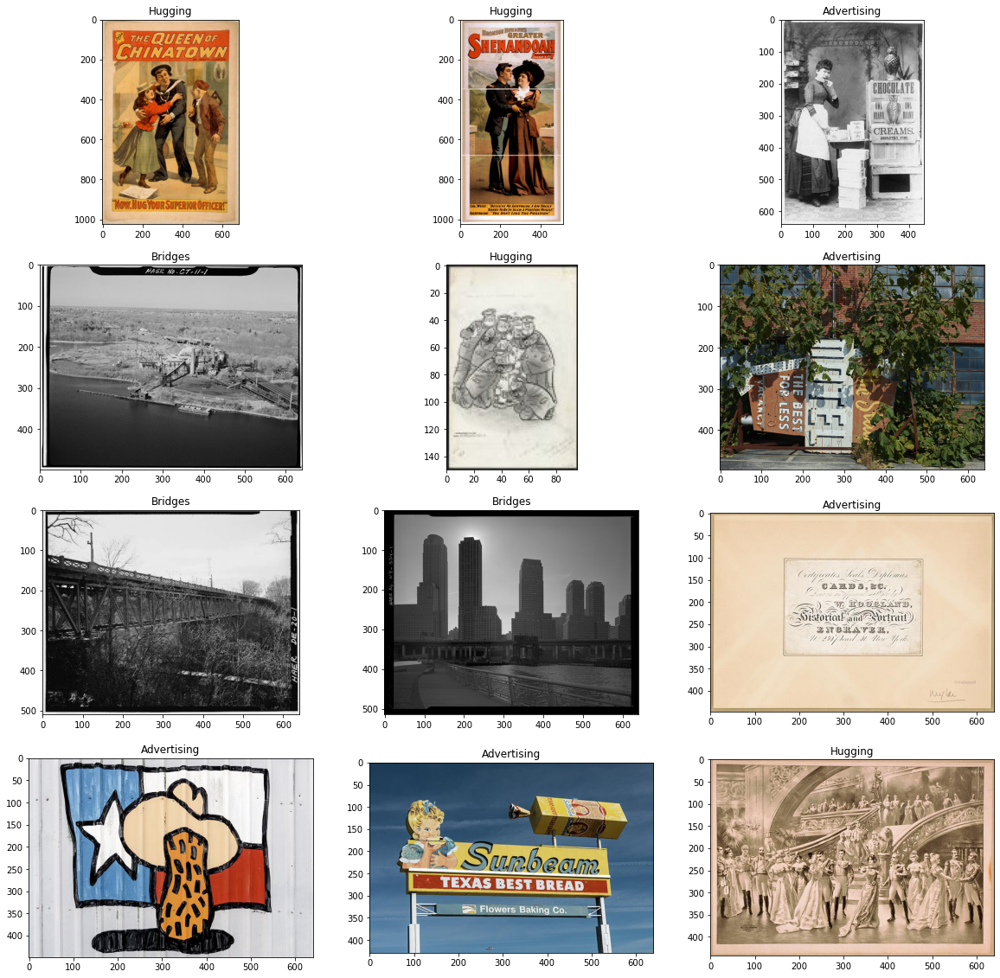

In [203]:
sample = filtered_loc.sample(12)
images = sample['url'].to_list()
labels = sample['term'].to_list()
plt.figure(figsize=(20,20))
columns = 3
for i, (image, label) in enumerate(zip(images, labels)):
    r = requests.get(image)
    image = Image.open(io.BytesIO(r.content))
    image = image.convert("RGB")
    plt.subplot(9 / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.title(label)

<ipython-input-206-764773e0e728>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(9 / columns + 1, columns, i + 1)


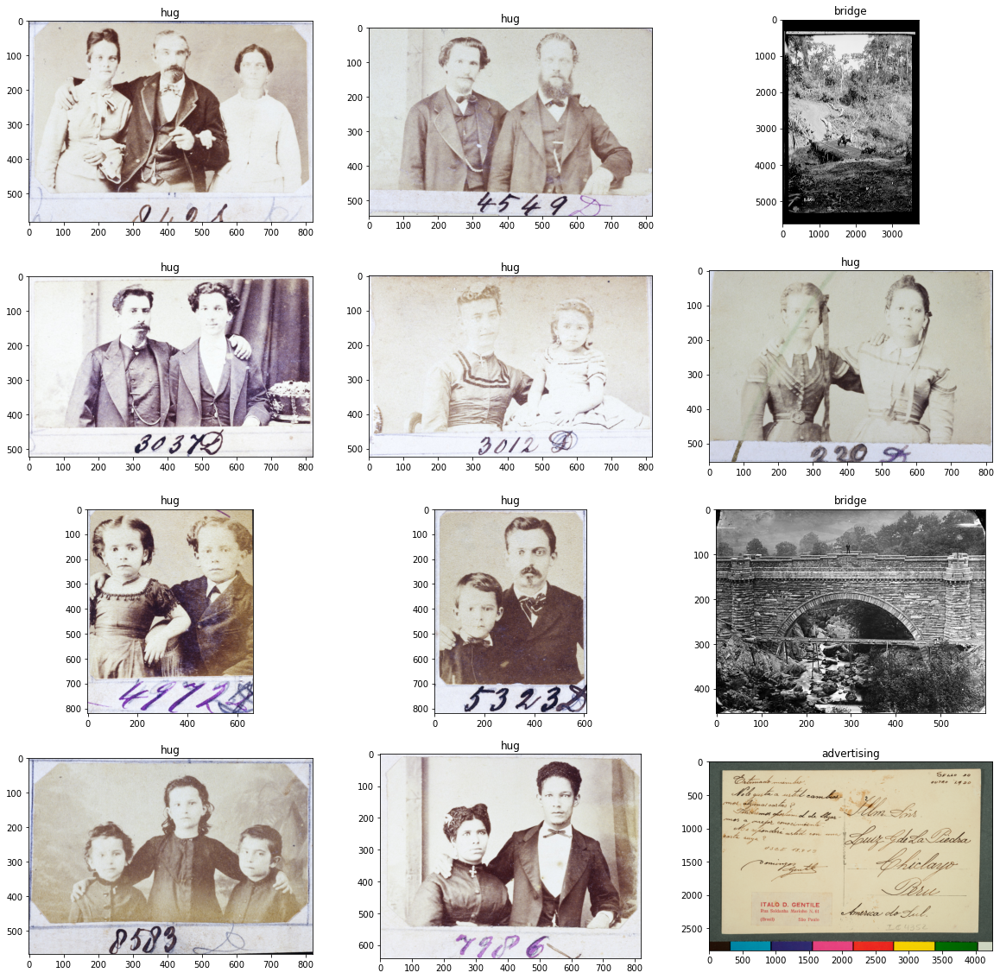

In [206]:
sample = filtered_wiki.sample(12)
images = sample['url'].to_list()
labels = sample['themeLabel'].to_list()
plt.figure(figsize=(20,20))
columns = 3
for i, (image, label) in enumerate(zip(images, labels)):
    r = requests.get(image)
    image = Image.open(io.BytesIO(r.content))
    image = image.convert("RGB")
    plt.subplot(9 / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.title(label)

In [439]:
import panel as pn

In [440]:
labels = filtered_wiki.tgm.unique().tolist()

In [466]:
def display_compare_images(label):
    column = pn.Column(f'# tgm term: {label}')
    loc_sample = filtered_loc[filtered_loc['id'] == label].sample(1)
    wiki_sample = filtered_wiki[filtered_wiki['tgm'] == label].sample(1)
    images_loc = loc_sample['url'].to_list()[0]
    labels_loc = loc_sample['term'].to_list()
    images_wiki = wiki_sample['url'].to_list()[0]
    labels_wiki = wiki_sample['themeLabel'].to_list()
    img_loc = pn.panel(images_loc, width=500)
    img_wiki = pn.panel(images_wiki,  width=500)
    column.append(pn.Row(pn.Column(f"# LIbrary of congress: {labels_loc[0].title()}",img_loc),
        pn.Column(f"# Wikidata:{labels_wiki[0].title()}", img_wiki))
    )
    return column

Column
    [0] Markdown(str)
    [1] Row
        [0] Column
            [0] Markdown(str)
            [1] JPG(str, width=500)
        [1] Column
            [0] Markdown(str)
            [1] JPG(str, width=500)
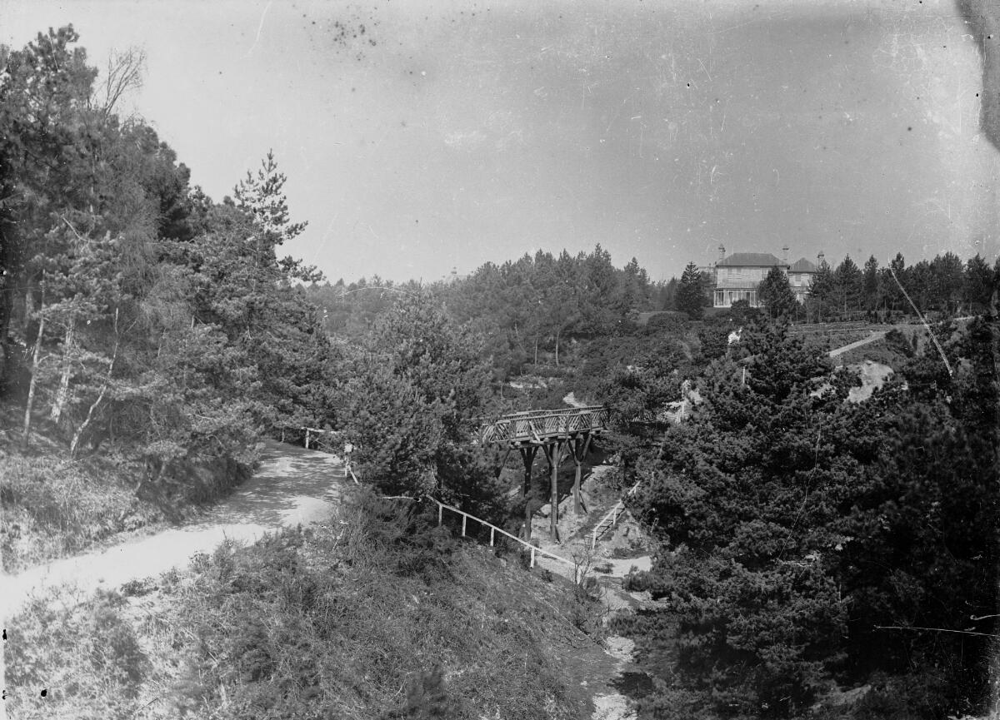
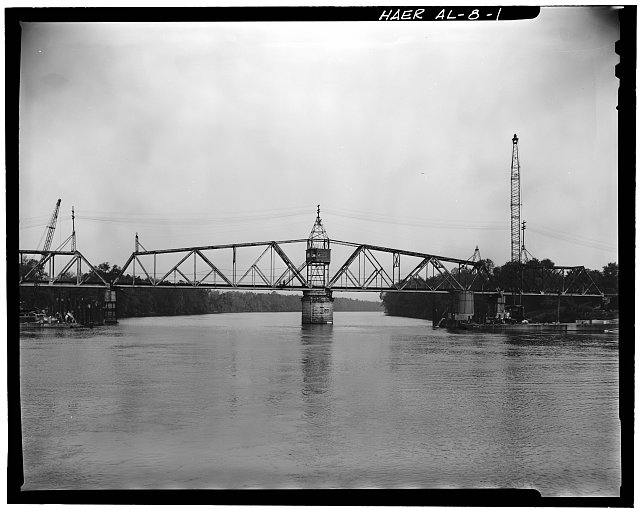

In [467]:
display_compare_images("tgm001333")

In [478]:
column = pn.Column(f'#Compare')
for label in labels:
    column.append(display_compare_images(label))


Column
    [0] Markdown(str)
    [1] Column
        [0] Markdown(str)
        [1] Row
            [0] Column
                [0] Markdown(str)
                [1] JPG(str, width=500)
            [1] Column
                [0] Markdown(str)
                [1] JPG(str, width=500)
    [2] Column
        [0] Markdown(str)
        [1] Row
            [0] Column
                [0] Markdown(str)
                [1] JPG(str, width=500)
            [1] Column
                [0] Markdown(str)
                [1] JPG(str, width=500)
    [3] Column
        [0] Markdown(str)
        [1] Row
            [0] Column
                [0] Markdown(str)
                [1] JPG(str, width=500)
            [1] Column
                [0] Markdown(str)
                [1] JPG(str, width=500)
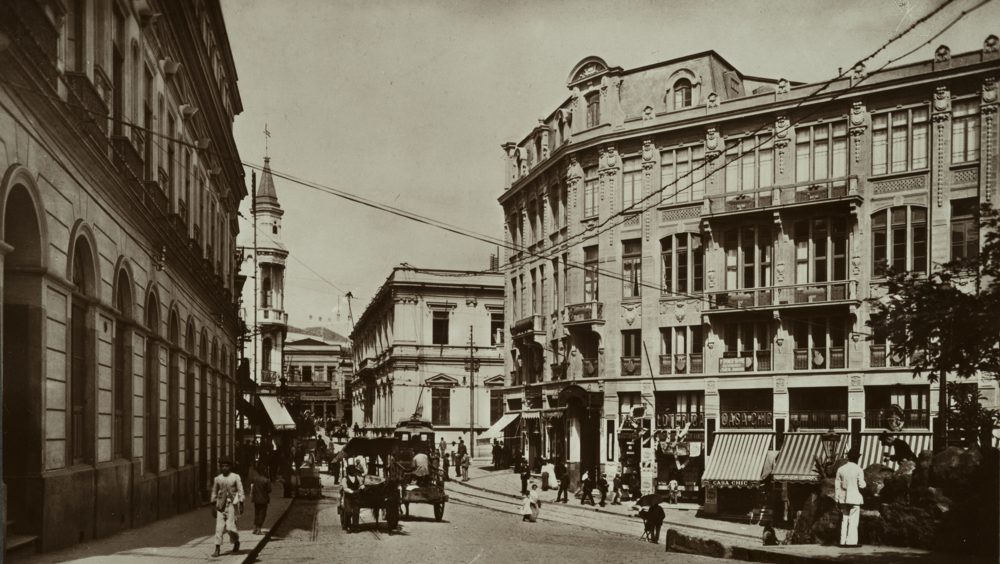
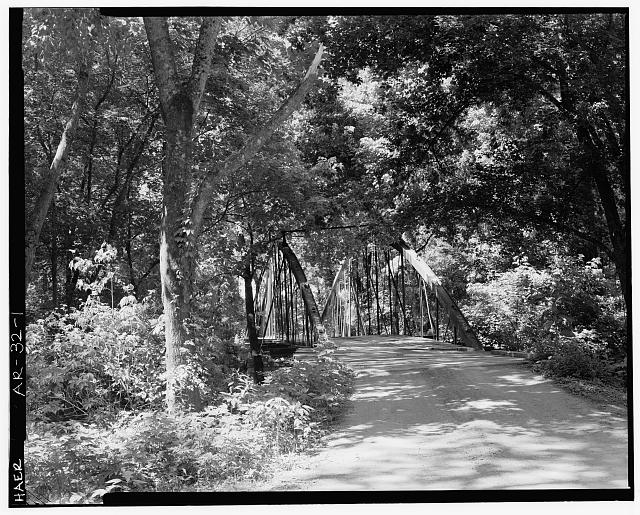
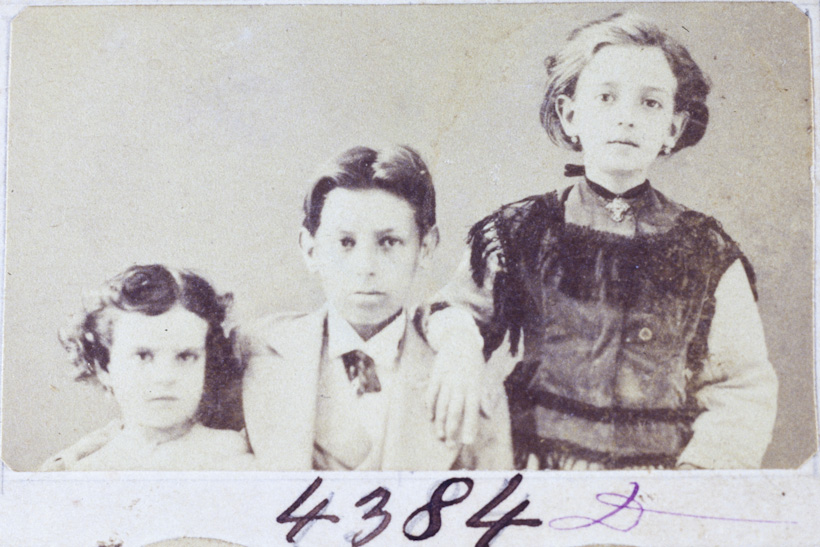
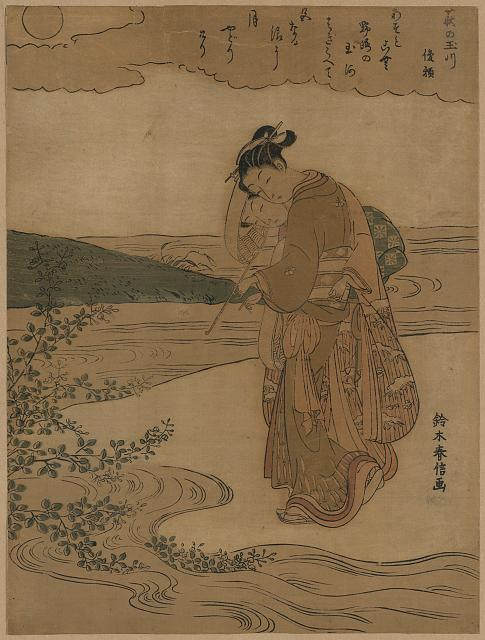
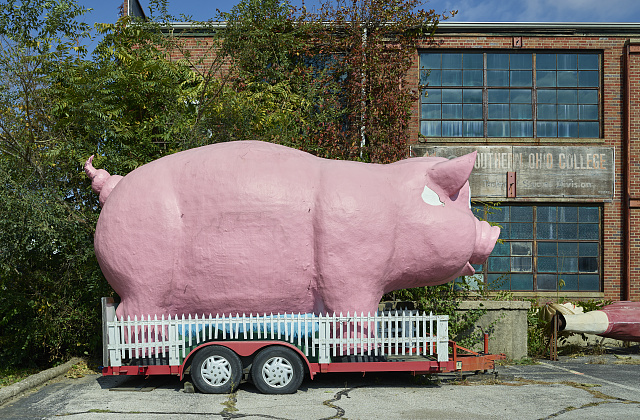
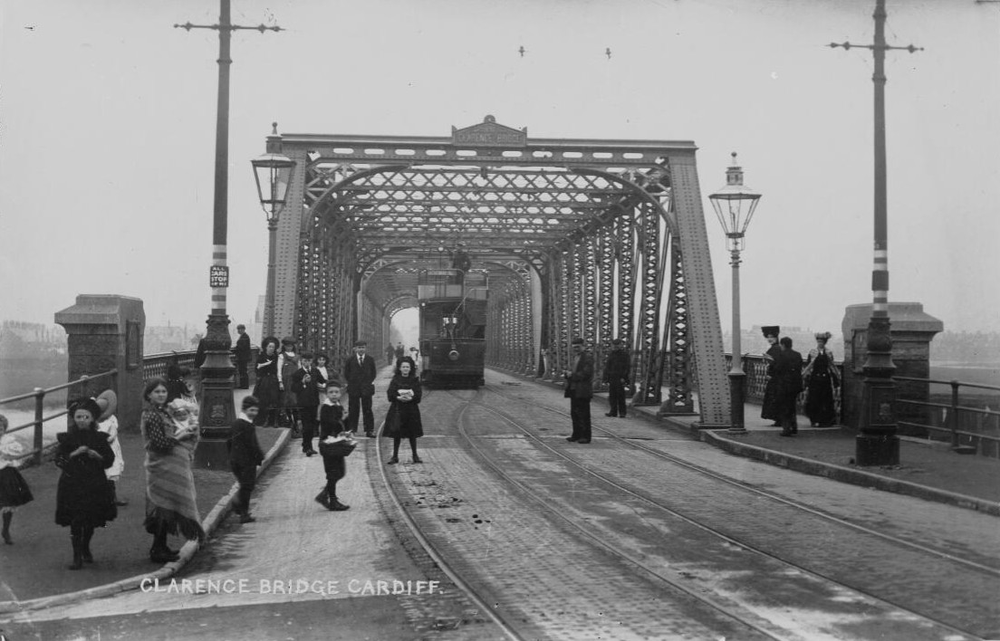

In [479]:
column

In [481]:
from bokeh.resources import INLINE
column.save('compare_loc_wiki_term_photos.html', resources=INLINE)

## Compare label frequencies

In [482]:
df = pd.DataFrame({"LOC": df_loc['id'], "Wikidata": df_wikidata['tgm']})

In [483]:
df

,LOC,Wikidata
0,tgm012273,tgm002065
1,tgm012273,tgm002065
2,tgm012273,tgm002065
3,tgm012273,tgm002065
4,tgm012273,tgm002065
...,...,...
12145,NaN,tgm000686
12146,NaN,tgm002207
12147,NaN,tgm003584
12148,NaN,tgm003584


In [484]:
df.reset_index(inplace=True)

In [485]:
data = pd.melt(frame=df, id_vars=["index"], value_name="tgm")

In [486]:
data

,index,variable,tgm
0,0,LOC,tgm012273
1,1,LOC,tgm012273
2,2,LOC,tgm012273
3,3,LOC,tgm012273
4,4,LOC,tgm012273
...,...,...,...
24295,12145,Wikidata,tgm000686
24296,12146,Wikidata,tgm002207
24297,12147,Wikidata,tgm003584
24298,12148,Wikidata,tgm003584


In [487]:
alt.Chart(data).mark_bar().encode(
    y=(alt.X('tgm:N',sort=alt.EncodingSortField(op='count', order='descending'))),
    x='count()',  color='variable',
).transform_filter(
   alt.datum.tgm
)

alt.Chart(...)